<a href="https://colab.research.google.com/github/AbigailMRod/GANsDL.AI/blob/main/WGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Wasserstein GAN con penalización de gradiente (WGAN-GP)

En este cuaderno, se construirá una GAN de Wasserstein con penalización de gradiente (WGAN-GP) que resuelve algunos de los problemas de estabilidad con las GAN que ha estado usando hasta este momento. Específicamente, se utilizará un tipo especial de función de pérdida conocida como W-loss, donde W significa Wasserstein, y penalizaciones de gradiente para evitar el colapso del modo.


## Generador y Crítico

Comenzaremos importando algunos paquetes útiles, definiendo funciones de visualización, construyendo el generador y construyendo el crítico. Dado que los cambios para WGAN-GP se realizan en la función de pérdida durante el entrenamiento, simplemente se puede reutilizar el código GAN anterior para el generador y la clase crítica. Recuerda que en WGAN-GP ya no se utiliza un discriminador que clasifica fake y real como 0 y 1 sino un critico que puntúa imágenes con números reales.

Paquetes y Visualizaciones

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) 


def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Función de visualización de imágenes: Dado un tensor de imágenes, número de imágenes y
     tamaño por imagen, traza e imprime las imágenes en una cuadrícula uniforme.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Generador y Ruido

In [2]:
class Generator(nn.Module):
    '''
    Clase de generador
     Valores:
         z_dim: la dimensión del vector de ruido, un escalar
         im_chan: el número de canales en las imágenes, ajustado para el conjunto de datos utilizado, un escalar
               (MNIST es en blanco y negro, por lo que 1 canal es su valor predeterminado)
         hidden_dim: la dimensión interna, un escalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Construir la red neuronal
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Función para devolver una secuencia de operaciones correspondiente a un bloque generador de DCGAN,
         correspondiente a una convolución transpuesta, una norma por lotes (excepto en la última capa) y una activación.
         Parámetros:
             input_channels: cuántos canales tiene la representación de la característica de entrada
             output_channels: cuántos canales debe tener la representación de la característica de salida
             kernel_size: el tamaño de cada filtro convolucional, equivalente a (kernel_size, kernel_size)
             stride: la zancada de la convolución
             final_layer: un valor booleano, verdadero si es la capa final y falso en caso contrario
                       (afecta la activación y la norma de lote)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Función para completar un paso hacia adelante del generador: Dado un tensor de ruido,
         devuelve las imágenes generadas.
         Parámetros:
             noise: un tensor de ruido con dimensiones (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Función para crear vectores de ruido: Dadas las dimensiones (n_samples, z_dim)
     crea un tensor de esa forma lleno de números aleatorios de la distribución normal.
     Parámetros:
         n_samples: el número de muestras a generar, un escalar
         z_dim: la dimensión del vector de ruido, un escalar
         device: el tipo de dispositivo
    '''
    return torch.randn(n_samples, z_dim, device=device)

Crítico

In [3]:
class Critic(nn.Module):
    '''
    Clase crítica
     Valores:
         im_chan: el número de canales en las imágenes, ajustado para el conjunto de datos utilizado, un escalar
               (MNIST es en blanco y negro, por lo que 1 canal es su valor predeterminado)
         hidden_dim: la dimensión interna, un escalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Función para devolver una secuencia de operaciones correspondiente a un bloque crítico de DCGAN;
         una convolución, una norma por lotes (excepto en la capa final) y una activación (excepto en la capa final).
         Parámetros:
             input_channels: cuántos canales tiene la representación de la característica de entrada
             output_channels: cuántos canales debe tener la representación de la característica de salida
             kernel_size: el tamaño de cada filtro convolucional, equivalente a (kernel_size, kernel_size)
             stride: la zancada de la convolución
             final_layer: un valor booleano, verdadero si es la capa final y falso en caso contrario
                       (afecta la activación y la norma de lote)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Función para completar un pase hacia adelante del crítico: Dado un tensor de imagen,
         devuelve un tensor de 1 dimensión que representa falso/real.
         Parámetros:
             image: un tensor de imagen aplanado con dimensión (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Inicializaciones de entrenamiento
Ahora puedes empezar a armarlo todo.
Como de costumbre, comenzaremos configurando los parámetros:
   * n_epochs: la cantidad de veces que itera a través de todo el conjunto de datos durante el entrenamiento
   * z_dim: la dimensión del vector de ruido
   * display_step: con qué frecuencia mostrar/visualizar las imágenes
   * batch_size: el número de imágenes por paso adelante/atrás
   * lr: la tasa de aprendizaje
   * beta_1, beta_2: los términos de impulso
   * c_lambda: peso de la penalización por gradiente
   * crit_repeats: cantidad de veces para actualizar el crítico por actualización del generador; hay más detalles al respecto en la sección *Poniéndolo todo junto*
   * device: el tipo de dispositivo

También cargará y transformará el conjunto de datos MNIST en tensores.

In [4]:
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



Luego, podemos inicializar el generador, crítico y optimizadores.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

## Penalización de gradiente
El cálculo de la penalización por gradiente se puede dividir en dos funciones: (1) calcular el gradiente con respecto a las imágenes y (2) calcular la penalización por gradiente dado el gradiente.

Puede comenzar obteniendo el degradado. El gradiente se calcula creando primero una imagen mixta. Esto se hace pesando la imagen real y la falsa usando épsilon y luego sumándolas. Una vez que tenga la imagen intermedia, puede obtener la salida del crítico en la imagen. Finalmente, calcula el gradiente de la puntuación de los críticos en las imágenes mixtas (salida) con respecto a los píxeles de las imágenes mixtas (entrada).

In [6]:
def get_gradient(crit, real, fake, epsilon):
    '''
    Devuelve el gradiente de las puntuaciones del crítico con respecto a las mezclas de imágenes reales y falsas.
     Parámetros:
         crit: el modelo crítico
         real: un lote de imágenes reales
         fake: un lote de imágenes falsas
         epsilon: un vector de las proporciones aleatorias uniformes de real/falso por imagen mixta
     Devoluciones:
         gradient: el gradiente de las partituras del crítico, con respecto a la imagen mixta
    '''
    # Mezclar las imágenes juntas
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calcule las puntuaciones de los críticos en las imágenes mixtas
    mixed_scores = crit(mixed_images)
    
    # Toma el gradiente de las partituras con respecto a las imágenes.
    gradient = torch.autograd.grad(
        # Nota: debe tomar el gradiente de salidas con respecto a las entradas.
        # Esta documentación puede ser útil, pero no debería ser necesaria:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # Estos otros parámetros tienen que ver con el funcionamiento del motor pytorch autograd
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient

In [7]:
# Prueba unitaria
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


La segunda función que se debe completar es calcular la penalización del gradiente dado el gradiente. Primero, calcula la magnitud del gradiente de cada imagen. La magnitud de un gradiente también se llama norma. Luego, calcula la penalización elevando al cuadrado la distancia entre cada magnitud y la norma ideal de 1 y tomando la media de todas las distancias al cuadrado.


In [8]:
def gradient_penalty(gradient):
    '''
    Devuelve la penalización del gradiente, dado un gradiente.
     Dado un lote de gradientes de imagen, calcula la magnitud del gradiente de cada imagen
     y penalizar la distancia cuadrática media de cada magnitud a 1.
     Parámetros:
         gradient: el gradiente de las partituras del crítico, con respecto a la imagen mixta
     Devoluciones:
         penalty: la penalización de gradiente
    '''
    # Aplane los degradados para que cada fila capture una imagen
    gradient = gradient.view(len(gradient), -1)

    # Calcular la magnitud de cada fila
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalizar la distancia media cuadrática de las normas de gradiente de 1
    #### START CODE HERE ####
    penalty = (torch.mean(gradient_norm)-1)**2
    #### END CODE HERE ####
    return penalty

In [9]:
# prueba unitaria
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Pérdidas
A continuación, debe calcular la pérdida para el generador y el crítico.

Para el generador, la pérdida se calcula maximizando la predicción del crítico sobre las imágenes falsas del generador. El argumento tiene las puntuaciones de todas las imágenes falsas del lote, pero utilizará la media de ellas.


In [10]:
def get_gen_loss(crit_fake_pred):
    '''
    Devuelva la pérdida de un generador dadas las puntuaciones de los críticos sobre las imágenes falsas del generador.
     Parámetros:
         crit_fake_pred: las puntuaciones de los críticos de las imágenes falsas
     Devoluciones:
         gen_loss: un valor de pérdida escalar para el lote actual del generador
    '''
    #### START CODE HERE ####
    gen_loss = -torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [11]:
# prueba unitaria
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


Para el crítico, la pérdida se calcula maximizando la distancia entre las predicciones del crítico sobre las imágenes reales y las predicciones sobre las imágenes falsas, al mismo tiempo que agrega una penalización de gradiente. La penalización por gradiente se pondera según lambda. Los argumentos son las puntuaciones de todas las imágenes del lote y utilizará la media de ellas.

In [12]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
   Devuelve la pérdida de un crítico dadas las puntuaciones del crítico para imágenes falsas y reales,
     la penalización de gradiente y el peso de la penalización de gradiente.
     Parámetros:
         crit_fake_pred: las puntuaciones de los críticos de las imágenes falsas
         crit_real_pred: las puntuaciones de la crítica sobre las imágenes reales
         gp: la penalización de gradiente no ponderada
         c_lambda: el peso actual de la penalización por gradiente
     Devoluciones:
         crit_loss: un escalar para la pérdida del crítico, teniendo en cuenta los factores relevantes
    '''
    #### START CODE HERE ####
    crit_loss = torch.mean(crit_fake_pred)-torch.mean(crit_real_pred)+c_lambda*gp
    #### END CODE HERE ####
    return crit_loss

In [13]:
# Prueba unitaria
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Poniendolo todo junto
Antes de poner todo junto, hay algunas cosas a tener en cuenta.
1. Incluso en GPU, el **entrenamiento se ejecutará más lentamente** que en laboratorios anteriores porque la penalización de gradiente requiere que calcules el gradiente de un gradiente, ¡esto significa potencialmente unos minutos por época! Para obtener los mejores resultados, ejecútelo todo el tiempo que pueda en la GPU.
2. Una diferencia importante con las versiones anteriores es que **actualizará el crítico varias veces** cada vez que actualice el generador. Esto ayuda a evitar que el generador domine al crítico. A veces, puede ver lo contrario, con el generador actualizado más veces que el crítico. Esto depende de la arquitectura (por ejemplo, la profundidad y el ancho de la red) y las opciones algorítmicas (por ejemplo, qué pérdida está utilizando).
3. WGAN-GP no está necesariamente destinado a mejorar el rendimiento general de una GAN, sino que solo **aumenta la estabilidad** y evita el colapso del modo. En general, un WGAN podrá entrenarse de una manera mucho más estable que el DCGAN estándar de la última asignación, aunque generalmente funcionará un poco más lento. También debería poder entrenar su modelo para más épocas sin que colapse.


 Una vez más, tenga en cuenta que esto funciona muy lentamente en una CPU. Una forma de ejecutar esto más rápidamente es descargar el .ipynb y subirlo a Google Drive, luego abrirlo con Google Colab y hacer que el tiempo de ejecución escriba GPU y reemplace
`dispositivo = "cpu"`
con
`dispositivo = "cuda"`
y asegúrese de que su función `get_noise` use el dispositivo correcto

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1, step 500: Generator loss: 8.366193112712354, critic loss: -119.17420129007003


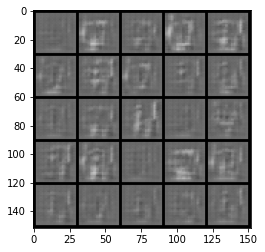

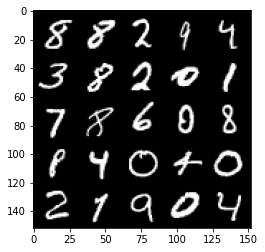

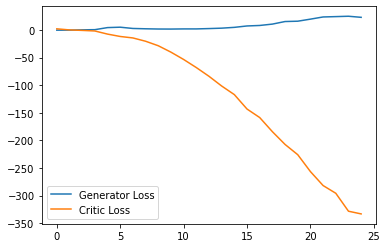

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: -30.24548543357849, critic loss: -165.520852087021


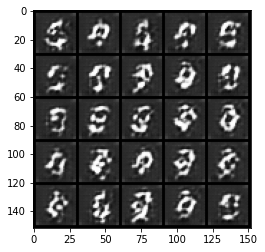

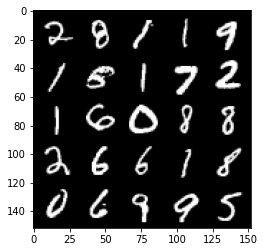

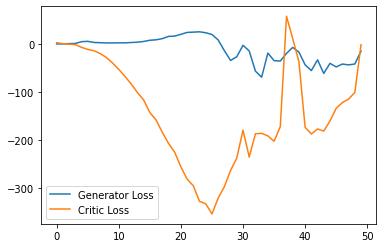

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3, step 1500: Generator loss: -14.460695116698743, critic loss: 2.4117965873718257


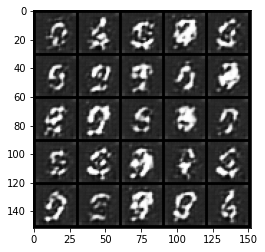

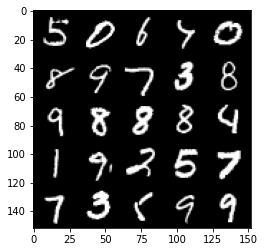

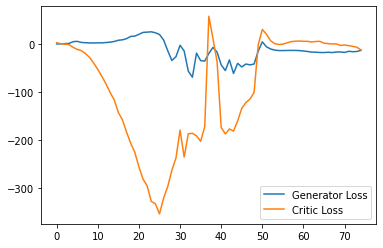

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 1.7161967532932758, critic loss: -14.619888990211493


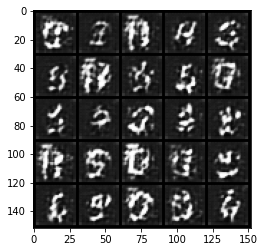

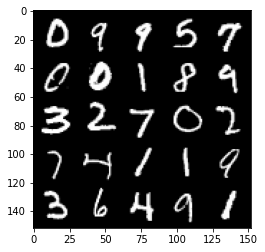

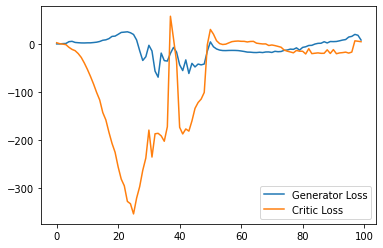

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5, step 2500: Generator loss: 9.96478643552959, critic loss: -15.625329741859426


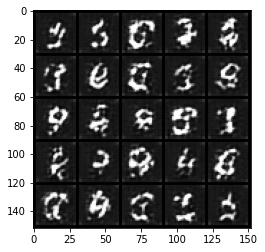

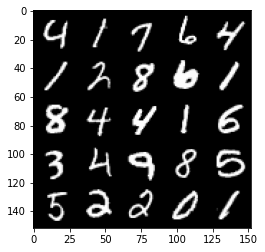

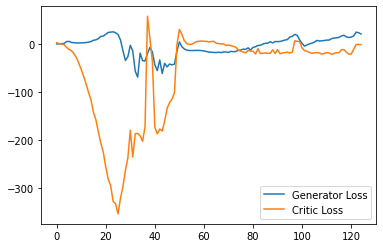

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 18.975922105550765, critic loss: -16.605284355258924


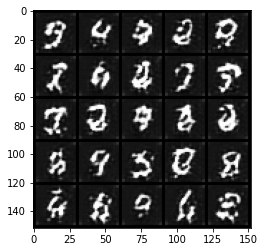

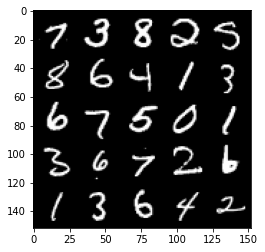

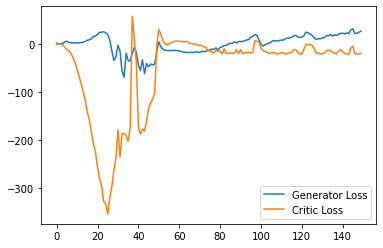

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7, step 3500: Generator loss: 32.92414843177795, critic loss: -16.744245594644546


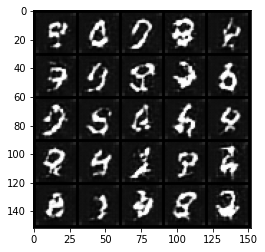

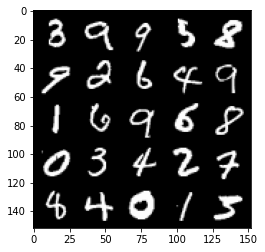

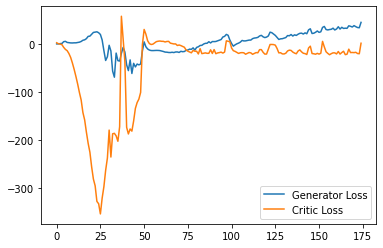

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8, step 4000: Generator loss: 39.70873520469666, critic loss: -15.912098077583307


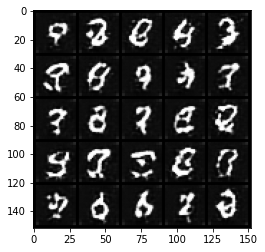

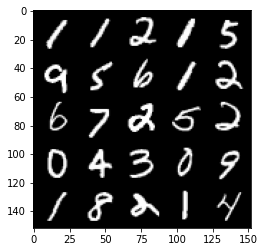

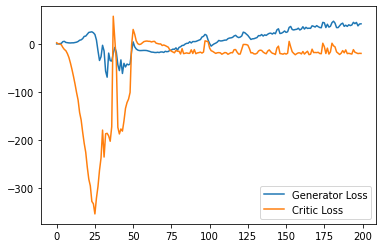

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9, step 4500: Generator loss: 44.92708396911621, critic loss: -16.562273268890376


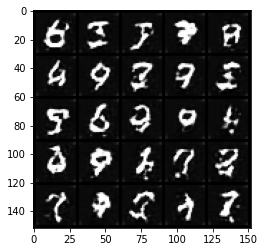

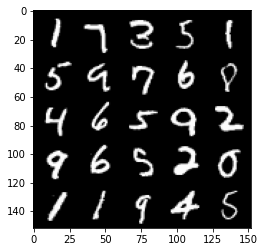

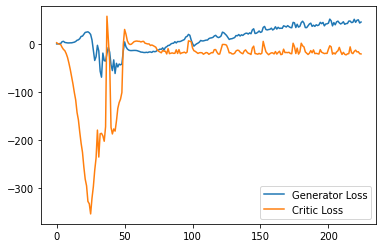

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10, step 5000: Generator loss: 52.38737551879883, critic loss: -13.950754349565518


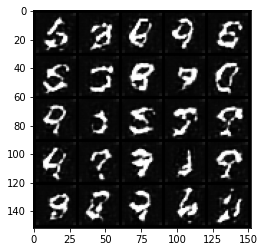

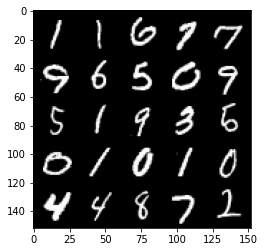

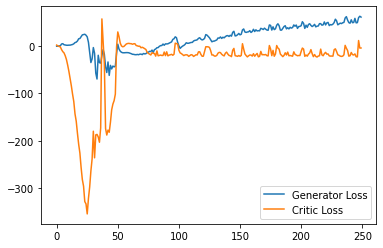

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11, step 5500: Generator loss: 54.00122959136963, critic loss: -11.302817670130722


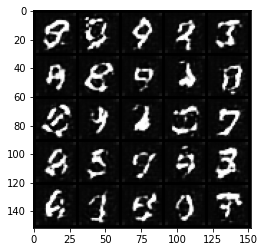

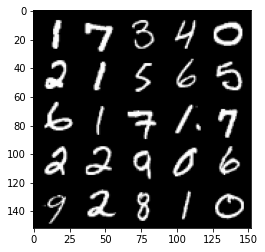

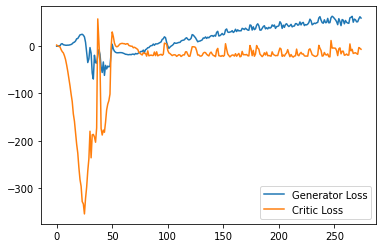

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12, step 6000: Generator loss: 53.82540454864502, critic loss: -14.678086013889324


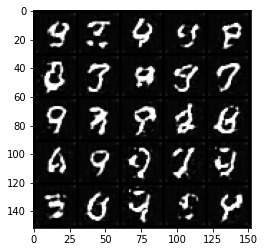

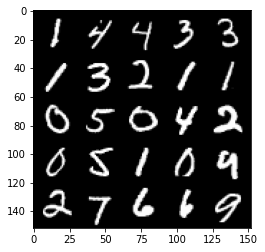

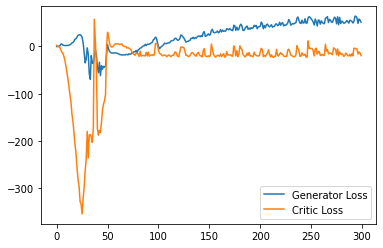

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13, step 6500: Generator loss: 55.76181593322754, critic loss: -15.552187056279196


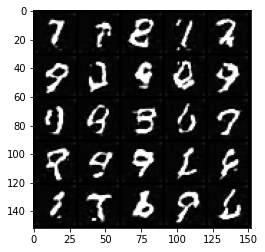

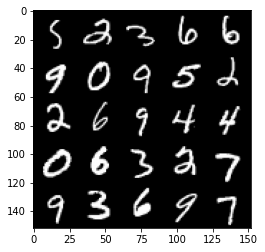

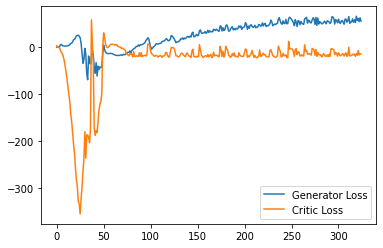

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14, step 7000: Generator loss: 60.5661390914917, critic loss: -17.118765475249294


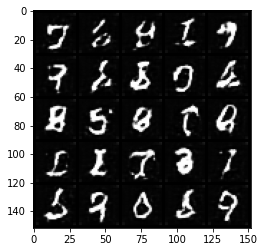

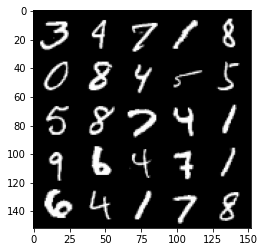

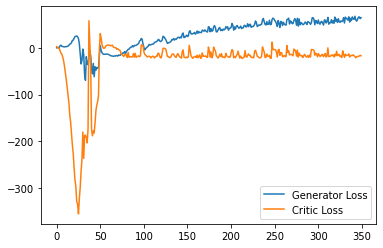

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15, step 7500: Generator loss: 63.19644742584229, critic loss: -15.935365320467948


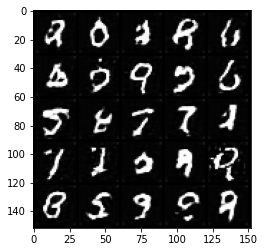

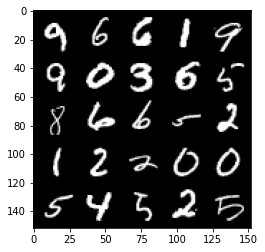

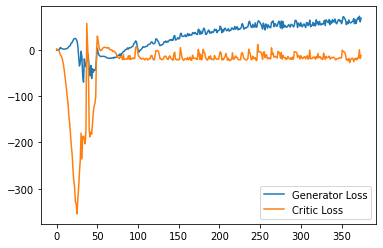

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17, step 8000: Generator loss: 66.56032344055176, critic loss: -17.864111121582976


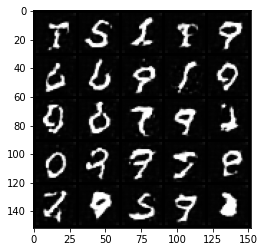

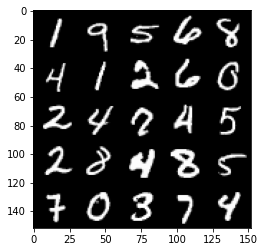

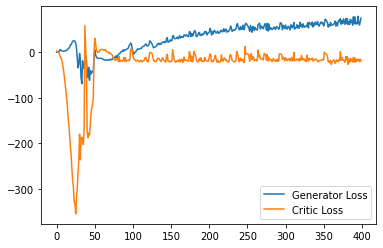

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 18, step 8500: Generator loss: 68.7187336654663, critic loss: -15.994781725347044


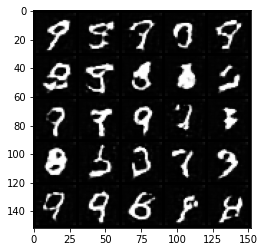

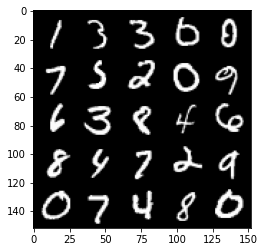

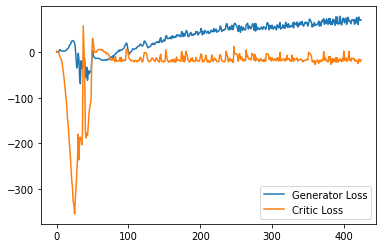

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19, step 9000: Generator loss: 71.31919037628174, critic loss: -17.897376828145966


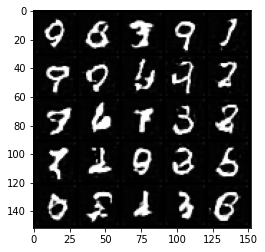

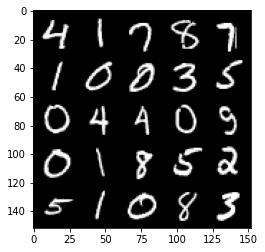

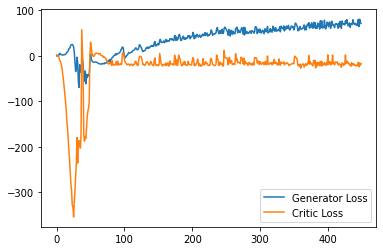

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 20, step 9500: Generator loss: 75.039570854187, critic loss: -16.358578678178795


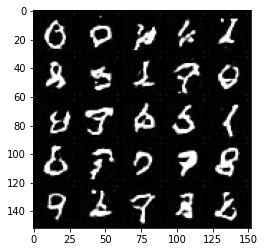

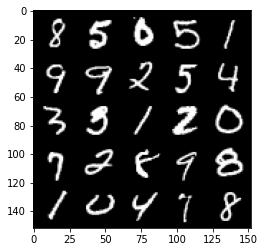

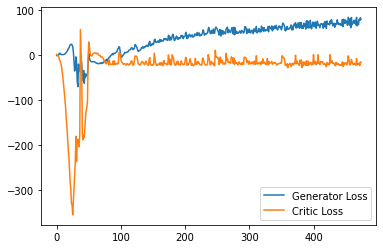

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21, step 10000: Generator loss: 77.19934683990479, critic loss: -15.661195538425428


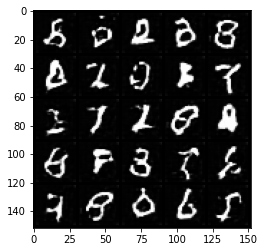

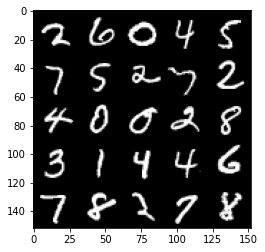

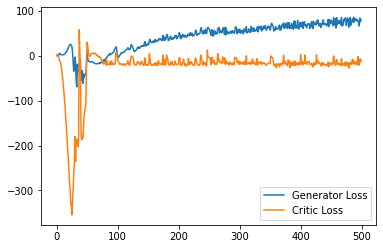

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 22, step 10500: Generator loss: 76.13945531845093, critic loss: -16.82372705863712


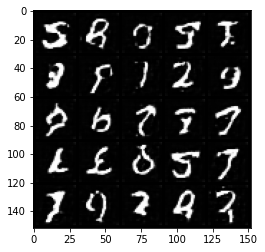

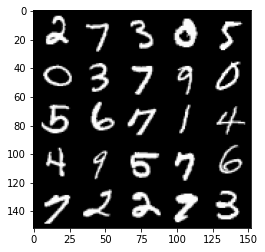

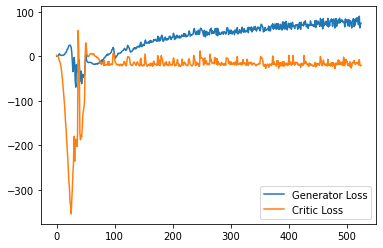

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23, step 11000: Generator loss: 76.05396296691895, critic loss: -18.538374062371286


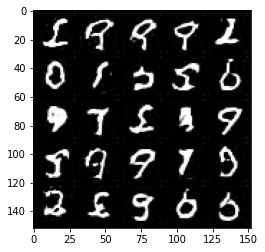

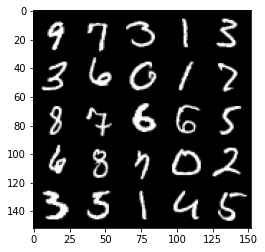

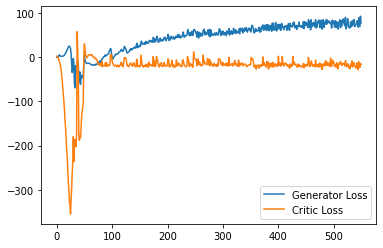

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 24, step 11500: Generator loss: 81.89069623565673, critic loss: -15.134048876714706


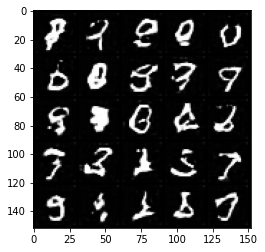

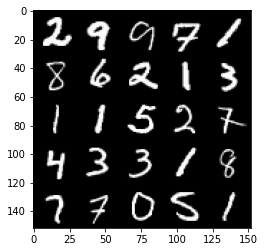

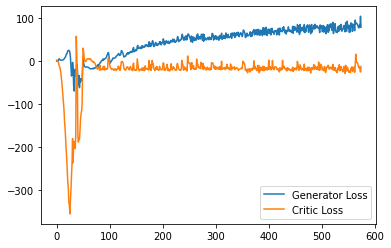

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25, step 12000: Generator loss: 82.6144556274414, critic loss: -17.92724082145691


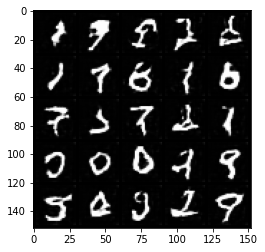

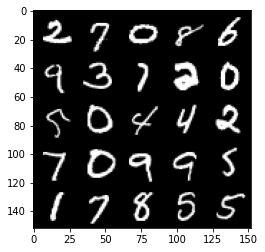

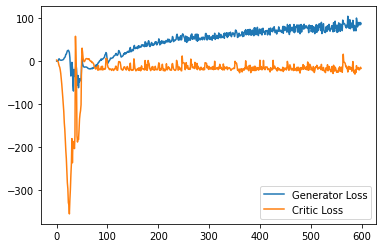

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 26, step 12500: Generator loss: 83.8001656036377, critic loss: -16.761440698003764


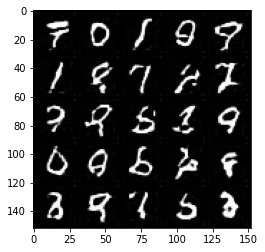

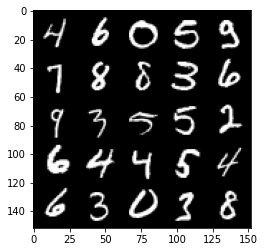

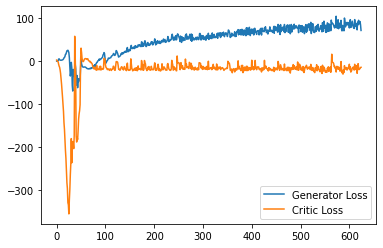

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27, step 13000: Generator loss: 86.53966482543946, critic loss: -15.058543112885951


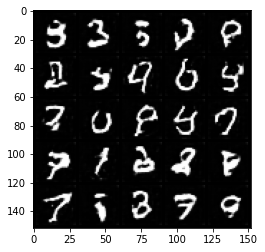

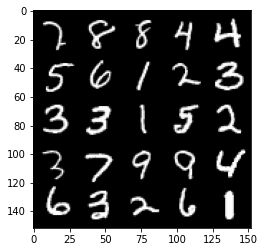

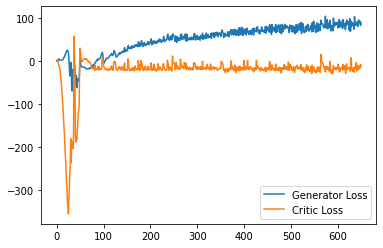

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 28, step 13500: Generator loss: 87.65412620544434, critic loss: -16.21417012766599


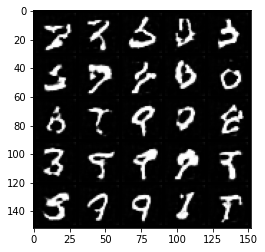

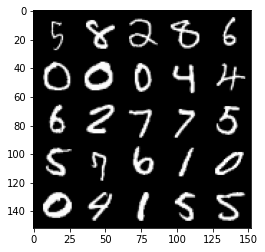

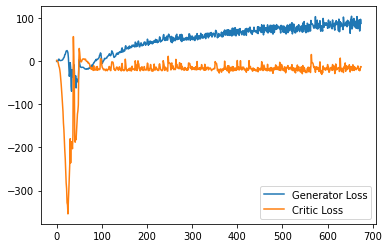

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29, step 14000: Generator loss: 88.83274646759033, critic loss: -15.475113594245915


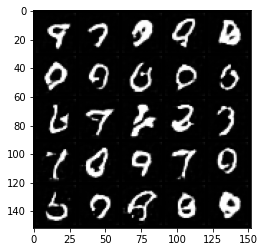

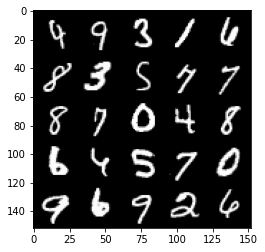

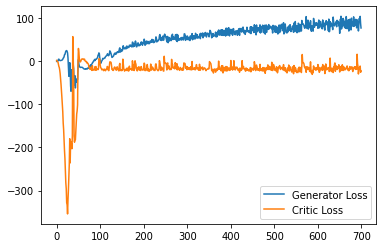

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 30, step 14500: Generator loss: 92.4274831161499, critic loss: -16.85498750118017


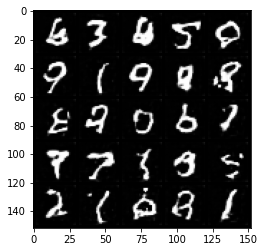

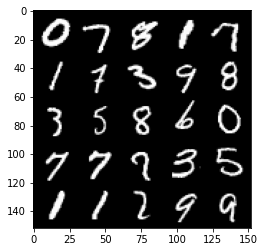

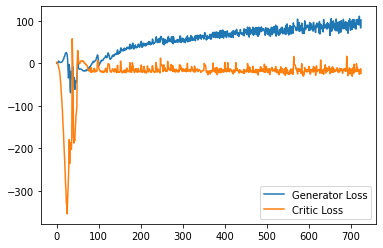

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31, step 15000: Generator loss: 91.86130041503907, critic loss: -13.144925332570065


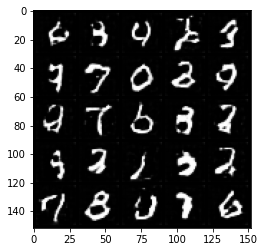

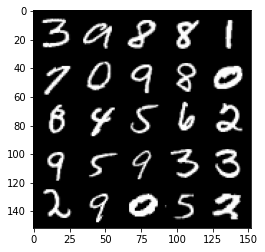

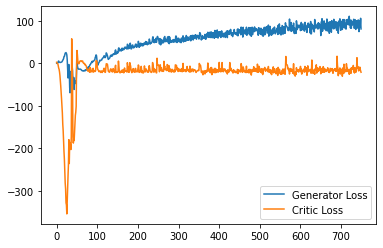

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 33, step 15500: Generator loss: 93.16887111663819, critic loss: -13.535358101475232


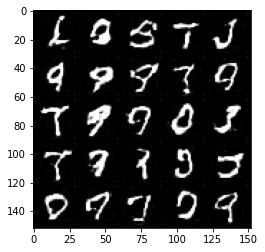

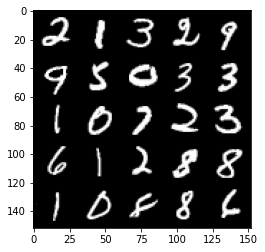

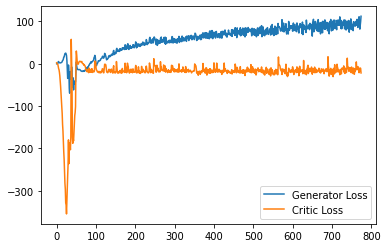

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34, step 16000: Generator loss: 94.96471229553222, critic loss: -14.564361898493773


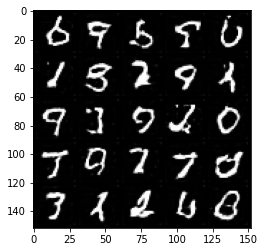

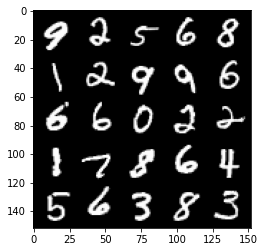

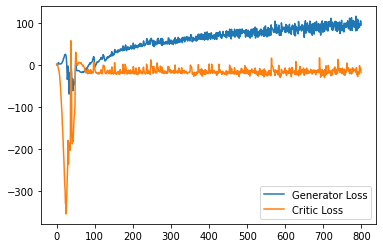

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 35, step 16500: Generator loss: 96.06310494995117, critic loss: -15.439899113523959


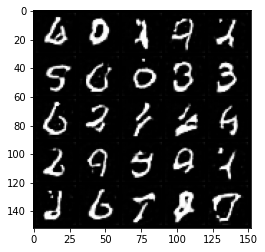

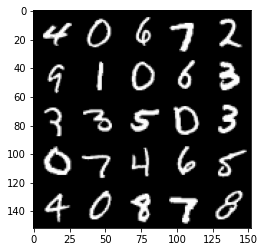

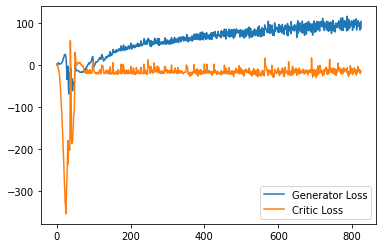

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36, step 17000: Generator loss: 98.5999701385498, critic loss: -12.815553333604326


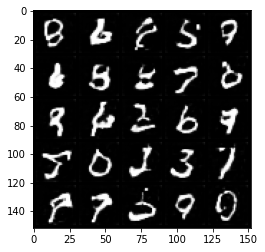

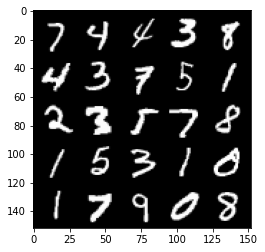

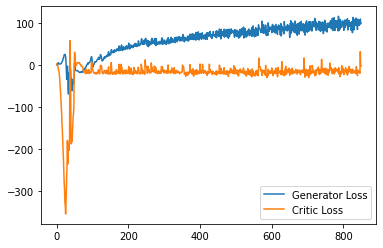

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 37, step 17500: Generator loss: 101.06208391571045, critic loss: -12.187786024957894


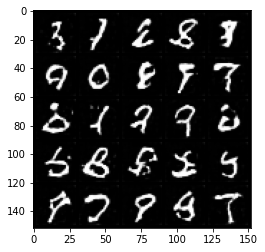

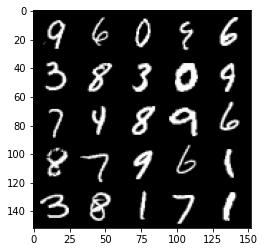

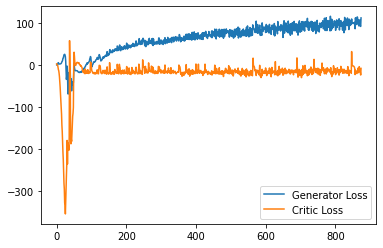

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38, step 18000: Generator loss: 102.16691510772705, critic loss: -11.13811506139635


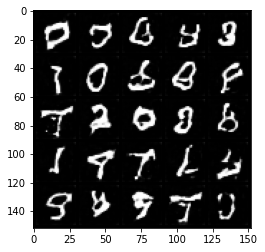

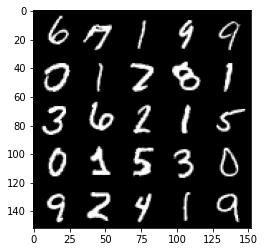

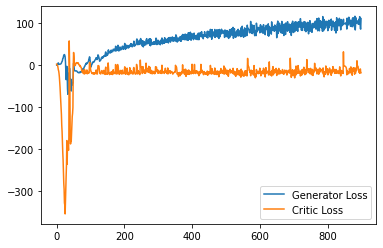

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 39, step 18500: Generator loss: 102.88770204162597, critic loss: -15.052711421084416


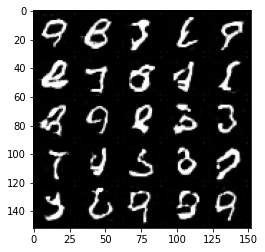

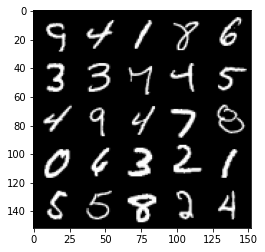

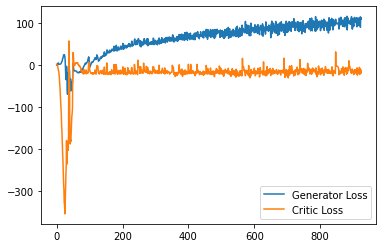

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40, step 19000: Generator loss: 105.02114156341553, critic loss: -15.169182910978781


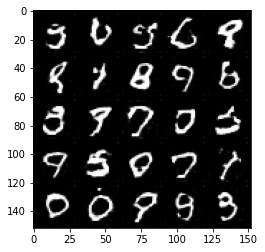

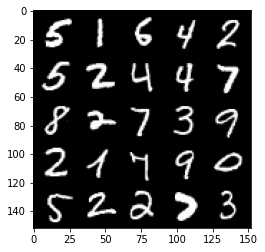

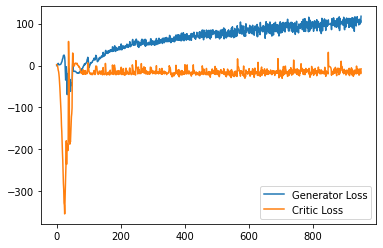

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 41, step 19500: Generator loss: 105.30928925323487, critic loss: -13.867807848370077


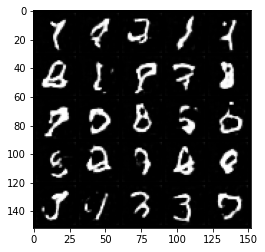

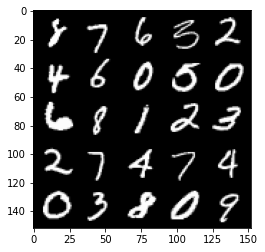

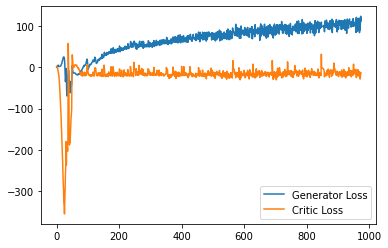

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42, step 20000: Generator loss: 106.09716761779785, critic loss: -14.330795657873162


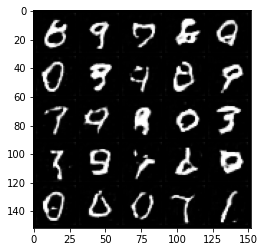

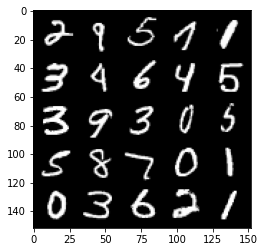

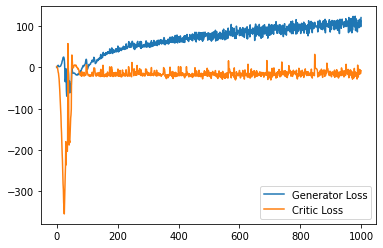

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 43, step 20500: Generator loss: 110.37631155395508, critic loss: -14.287494541597365


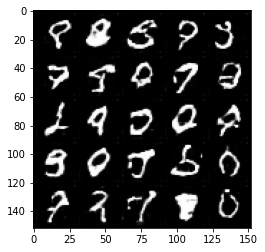

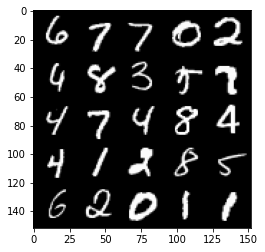

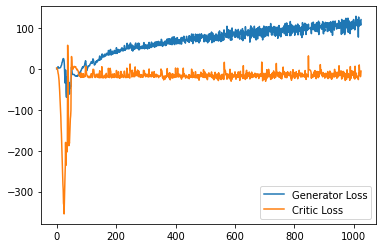

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44, step 21000: Generator loss: 113.12809756469727, critic loss: -17.012585102272038


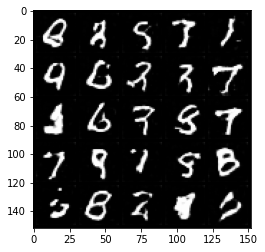

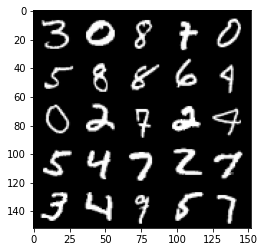

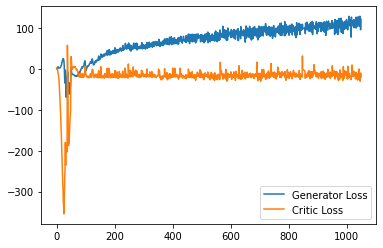

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 45, step 21500: Generator loss: 112.63183270263671, critic loss: -15.074222439479826


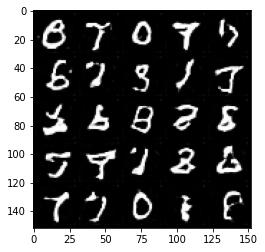

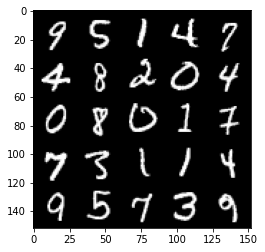

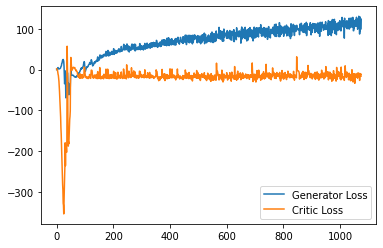

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46, step 22000: Generator loss: 110.6374536819458, critic loss: -12.64877884035707


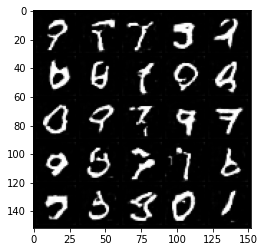

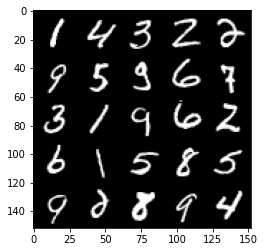

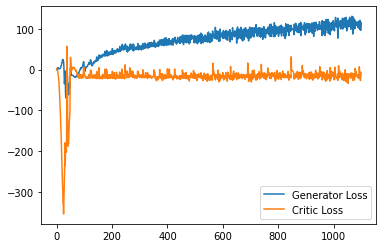

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 47, step 22500: Generator loss: 113.77931369018555, critic loss: -15.363029954683793


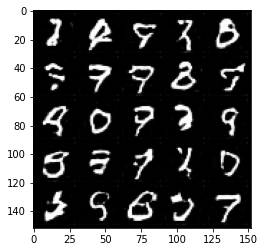

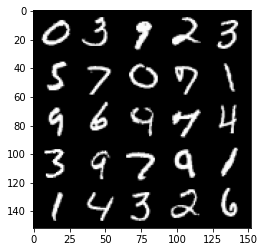

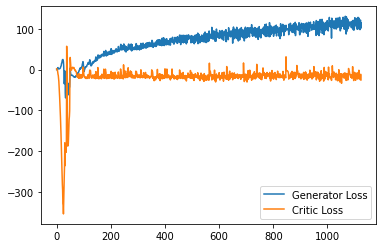

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 49, step 23000: Generator loss: 110.20024835968017, critic loss: -13.898758127892021


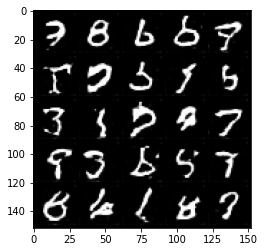

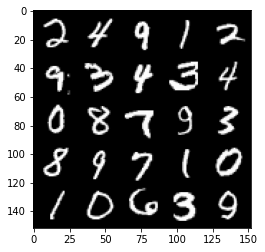

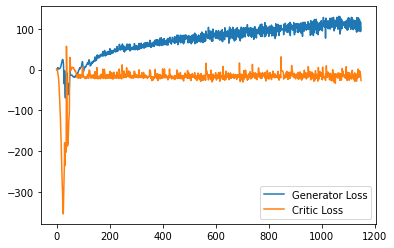

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 50, step 23500: Generator loss: 110.03933980560302, critic loss: -16.442804287728666


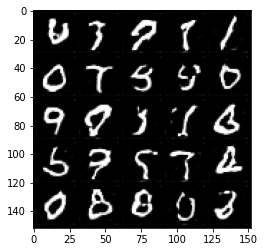

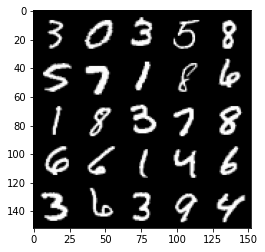

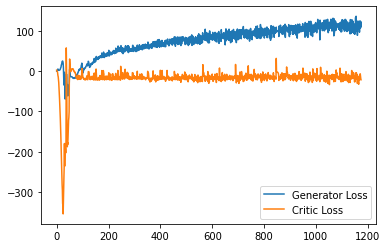

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 51, step 24000: Generator loss: 112.35428170776368, critic loss: -12.701886840169132


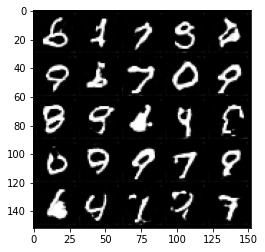

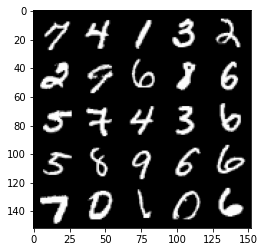

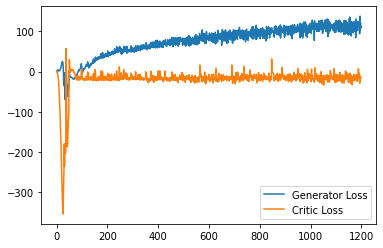

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 52, step 24500: Generator loss: 115.94052130889892, critic loss: -12.666991480541224


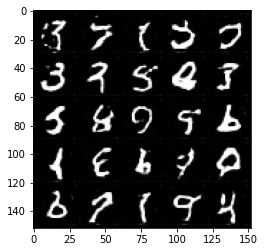

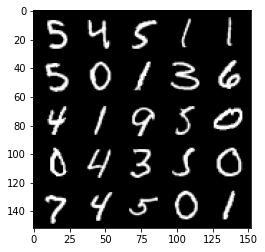

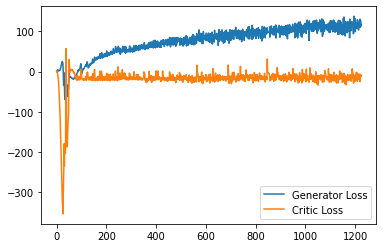

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 53, step 25000: Generator loss: 117.69979684448242, critic loss: -15.417540871241684


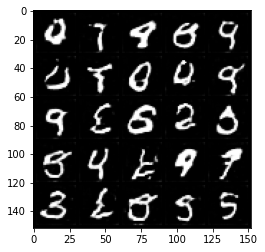

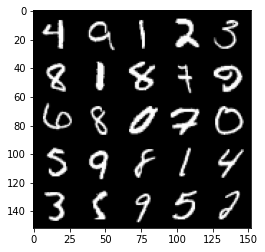

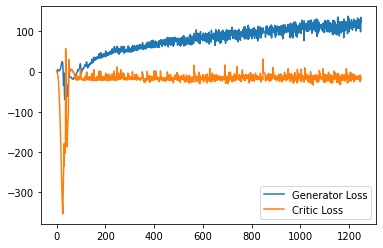

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 54, step 25500: Generator loss: 117.76776096343994, critic loss: -15.232848189431433


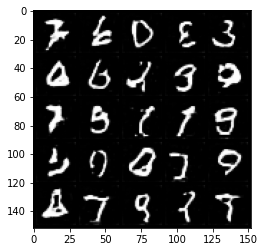

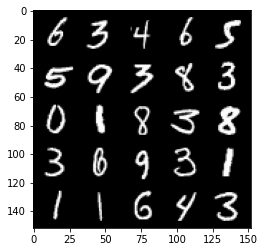

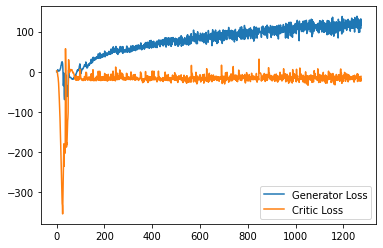

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 55, step 26000: Generator loss: 119.7619764328003, critic loss: -15.956507247039676


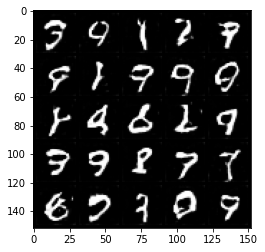

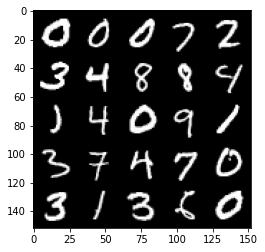

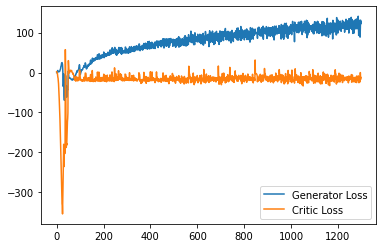

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 56, step 26500: Generator loss: 120.11893629455567, critic loss: -16.588868573486792


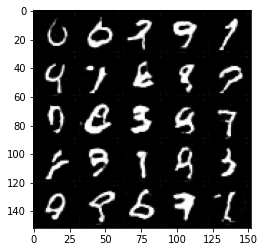

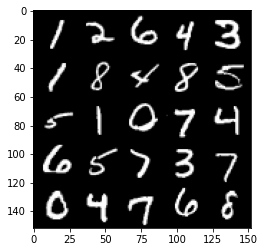

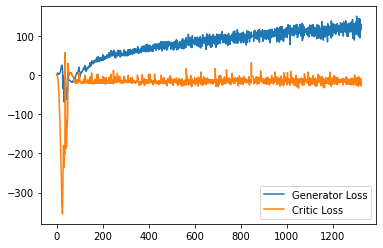

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 57, step 27000: Generator loss: 121.53795235443116, critic loss: -12.505919708865862


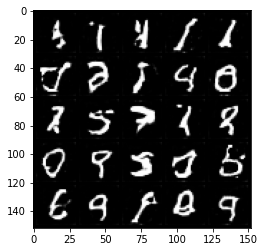

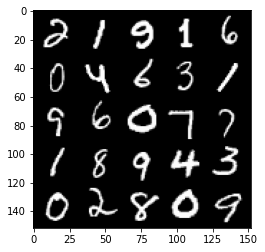

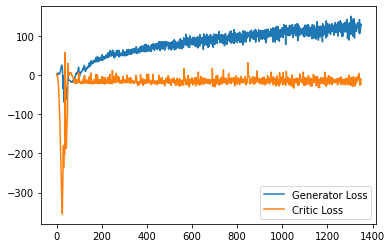

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 58, step 27500: Generator loss: 121.44409922027587, critic loss: -15.77579558679015


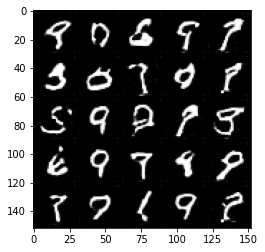

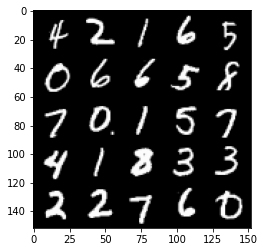

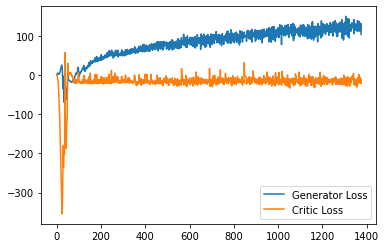

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 59, step 28000: Generator loss: 119.77388287353516, critic loss: -18.83401950842143


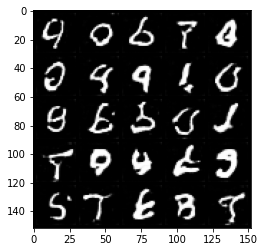

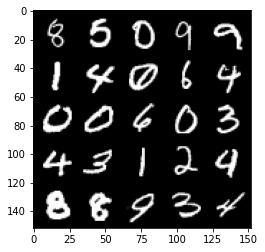

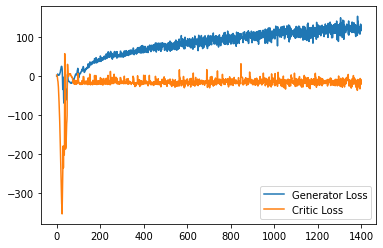

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 60, step 28500: Generator loss: 124.2985330657959, critic loss: -17.63011891568899


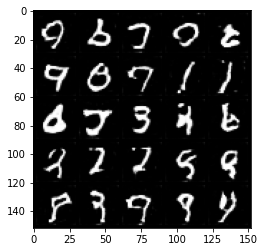

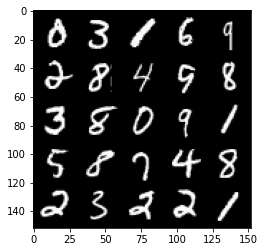

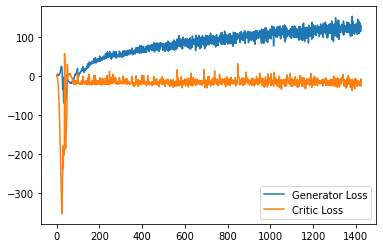

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 61, step 29000: Generator loss: 120.2326738204956, critic loss: -16.020757668137573


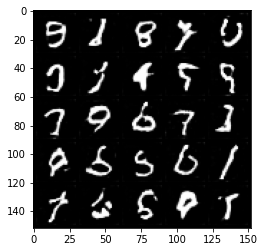

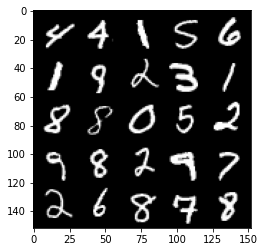

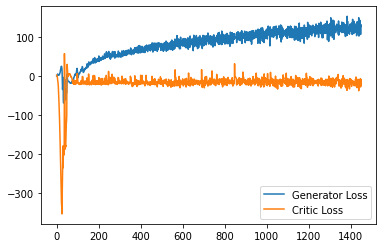

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 62, step 29500: Generator loss: 125.06958459472656, critic loss: -15.139946195161343


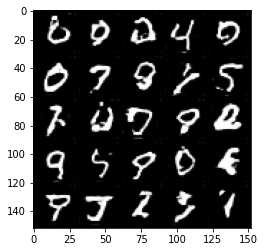

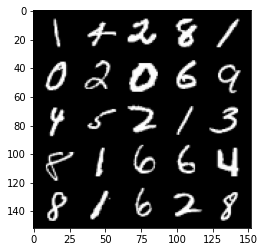

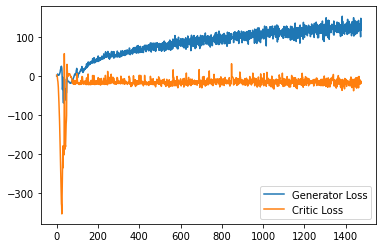

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 63, step 30000: Generator loss: 125.88713256072998, critic loss: -15.691973347359903


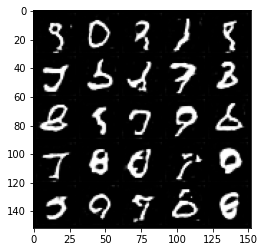

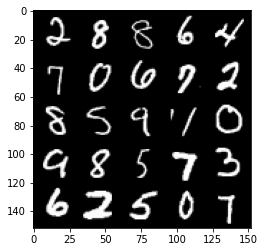

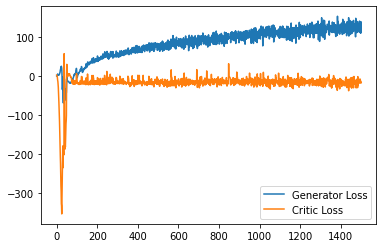

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 65, step 30500: Generator loss: 128.01985735702516, critic loss: -14.48986450009347


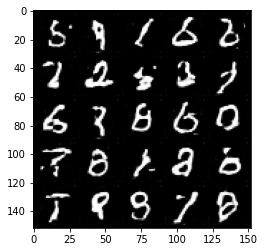

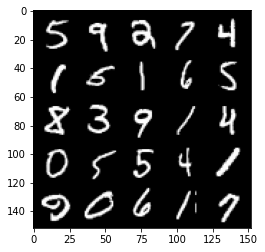

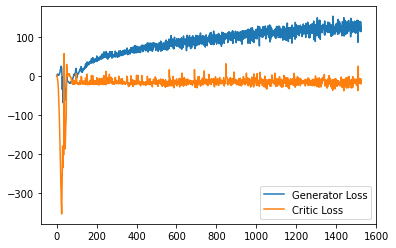

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 66, step 31000: Generator loss: 128.27102615356446, critic loss: -17.675482087257517


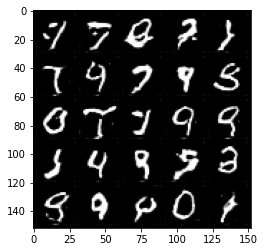

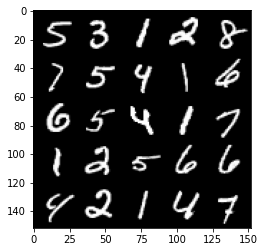

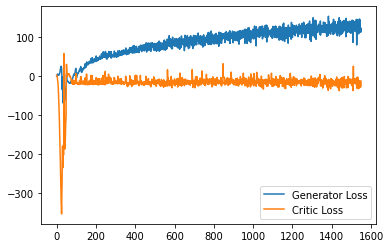

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 67, step 31500: Generator loss: 133.30513410949706, critic loss: -15.136459623420247


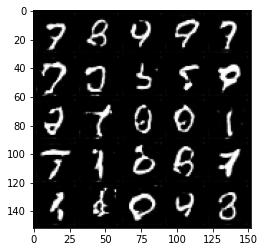

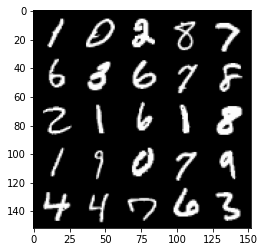

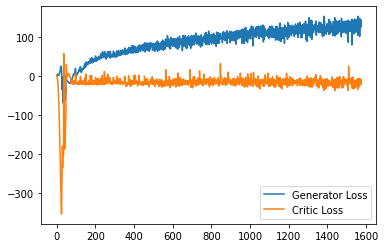

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 68, step 32000: Generator loss: 134.87341500854492, critic loss: -14.2786957174957


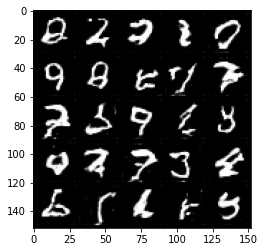

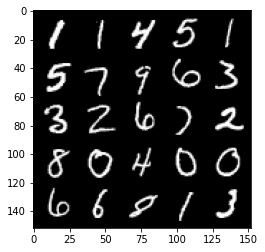

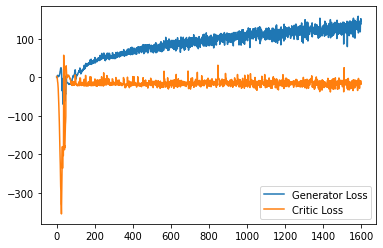

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 69, step 32500: Generator loss: 133.56613836669922, critic loss: -16.836740899562816


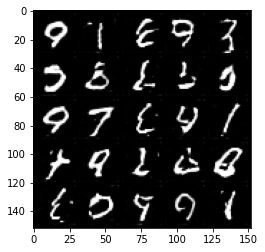

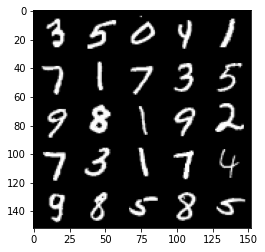

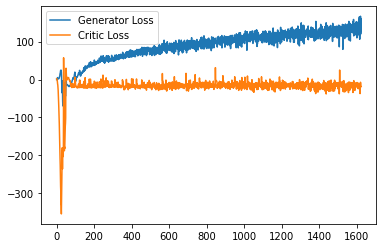

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 70, step 33000: Generator loss: 137.80530747985839, critic loss: -12.739881569719307


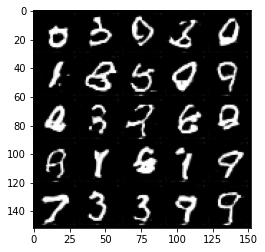

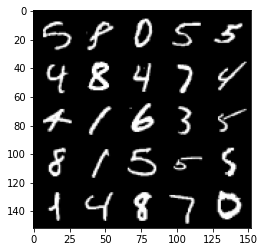

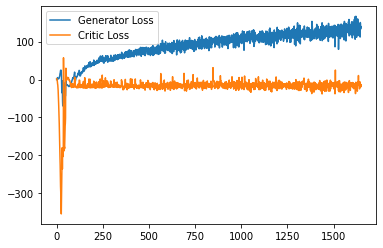

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 71, step 33500: Generator loss: 139.51819535827636, critic loss: -17.314861880290522


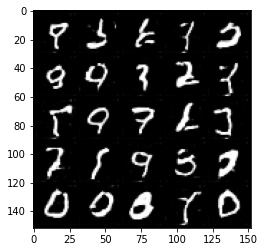

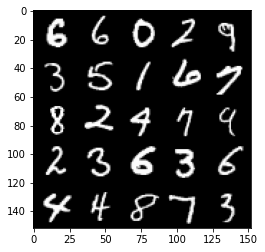

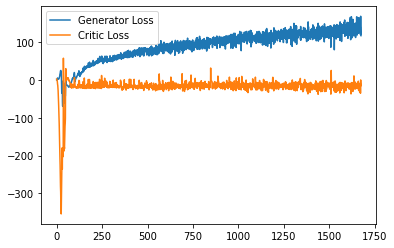

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 72, step 34000: Generator loss: 138.83732767486572, critic loss: -14.500447695213538


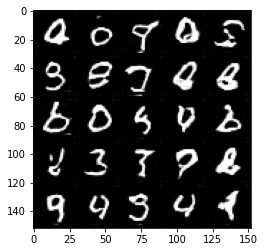

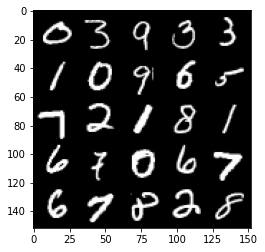

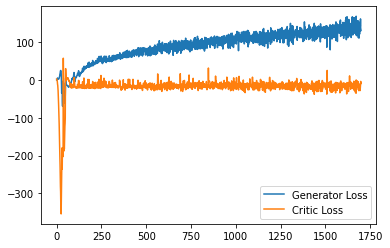

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 73, step 34500: Generator loss: 139.61528678131103, critic loss: -15.207461864203225


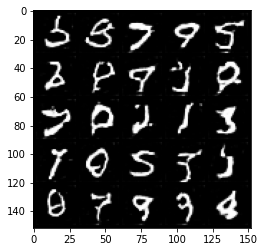

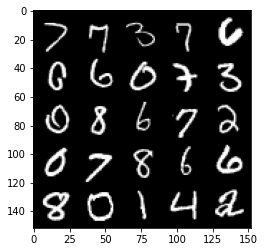

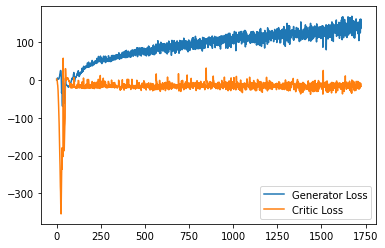

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 74, step 35000: Generator loss: 138.85965993499755, critic loss: -17.459851698246585


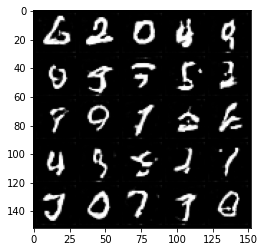

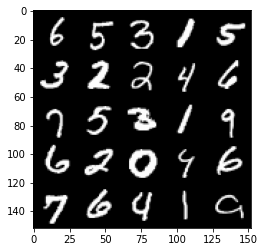

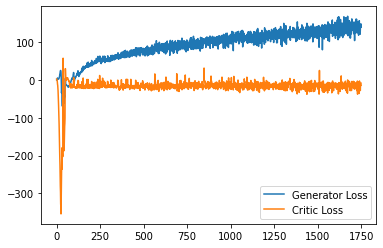

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 75, step 35500: Generator loss: 142.29980940246583, critic loss: -12.532388412255044


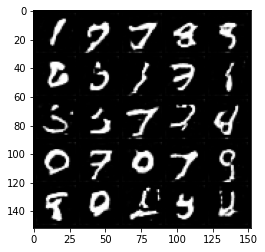

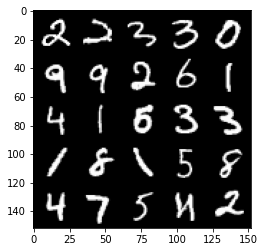

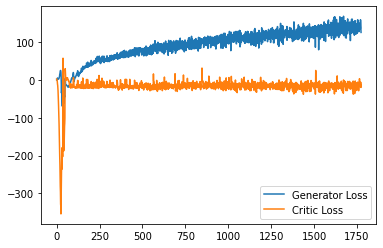

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 76, step 36000: Generator loss: 142.6265188446045, critic loss: -15.077924127477402


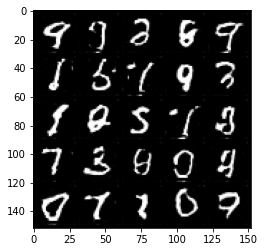

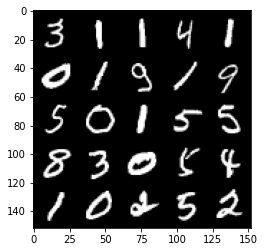

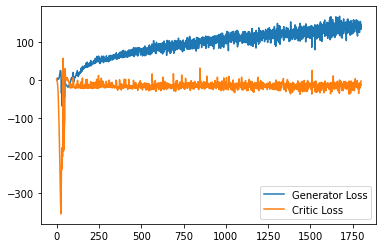

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 77, step 36500: Generator loss: 141.3750657196045, critic loss: -17.15950030685959


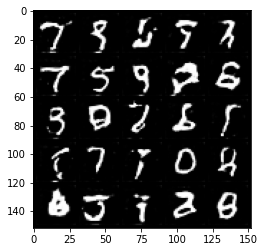

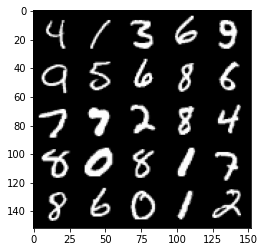

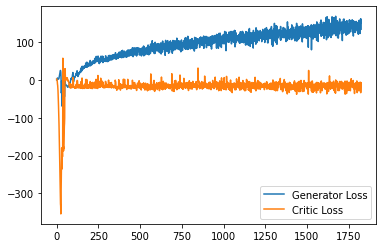

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 78, step 37000: Generator loss: 140.76883866882324, critic loss: -14.037716542297602


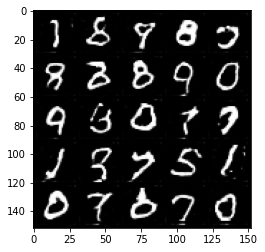

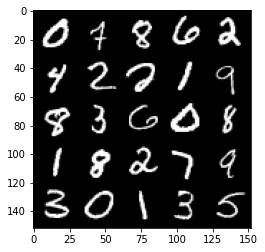

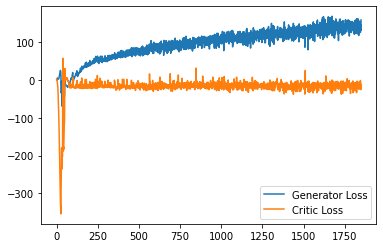

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 79, step 37500: Generator loss: 144.92562296295165, critic loss: -13.249393959447735


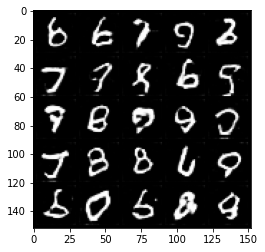

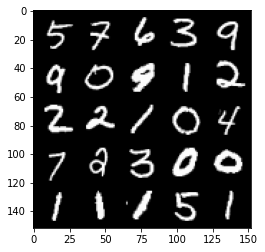

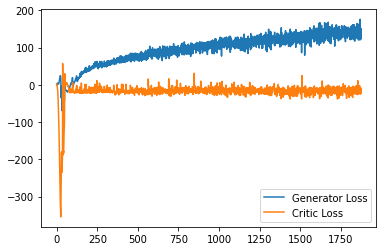

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 81, step 38000: Generator loss: 145.24949348449707, critic loss: -16.877203780603402


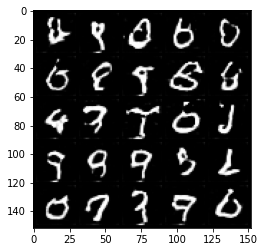

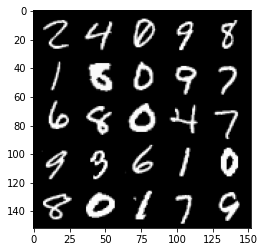

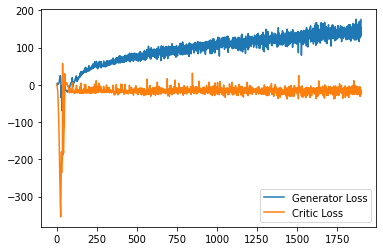

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 82, step 38500: Generator loss: 150.30338327026368, critic loss: -16.954746809810395


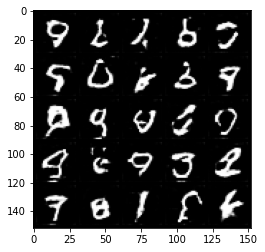

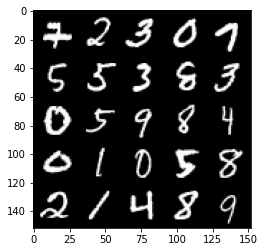

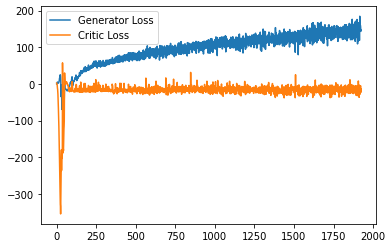

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 83, step 39000: Generator loss: 152.71206662750245, critic loss: -16.27705759581327


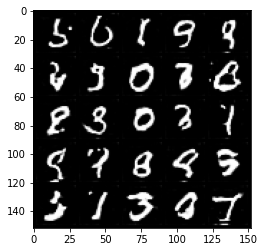

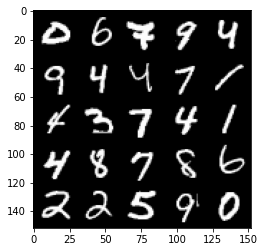

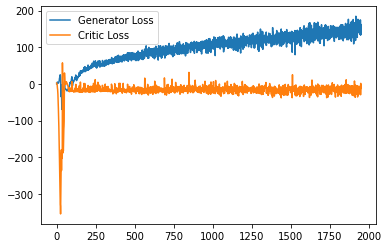

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 84, step 39500: Generator loss: 152.38299953460694, critic loss: -15.65678176140488


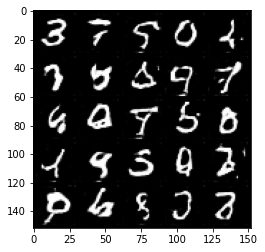

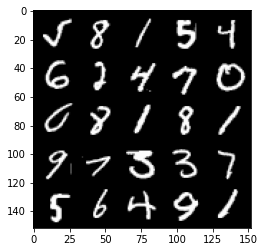

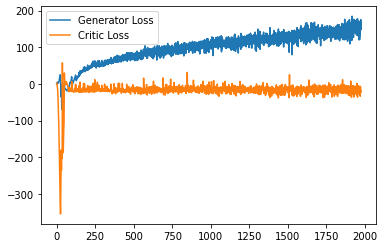

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 85, step 40000: Generator loss: 155.62024948120117, critic loss: -19.557938171076767


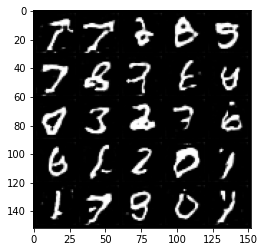

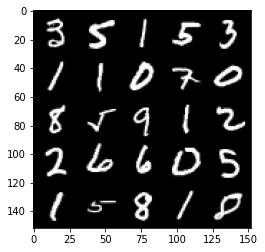

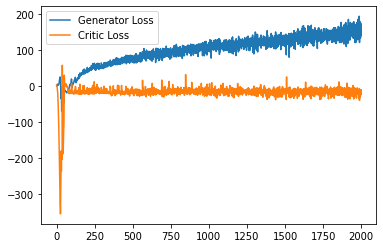

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 86, step 40500: Generator loss: 155.7735692214966, critic loss: -16.589919557368766


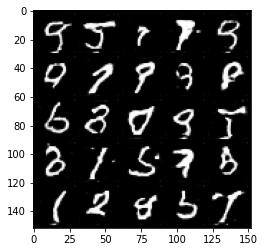

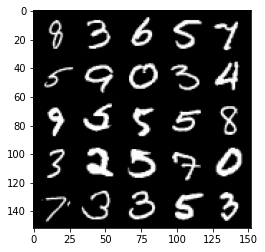

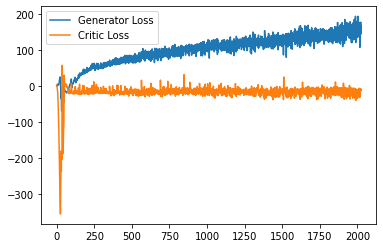

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 87, step 41000: Generator loss: 156.83136640167237, critic loss: -15.90705016052723


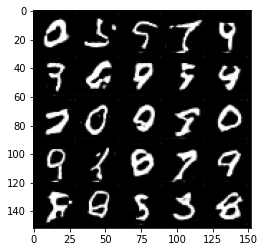

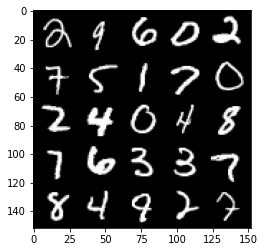

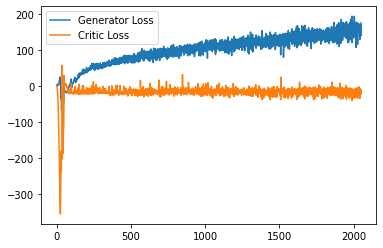

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 88, step 41500: Generator loss: 158.47601542663574, critic loss: -15.848044464957722


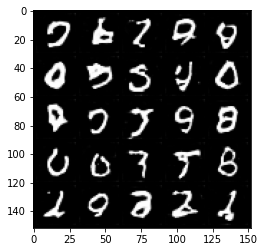

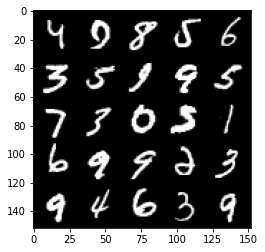

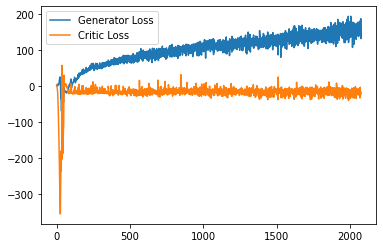

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 89, step 42000: Generator loss: 159.86337830352784, critic loss: -18.703023390984534


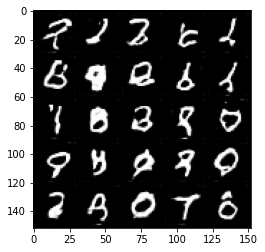

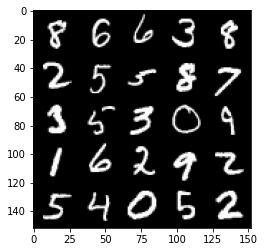

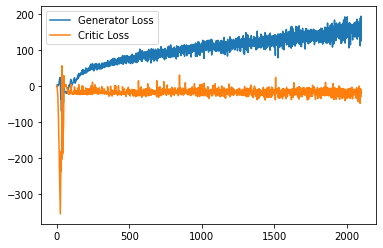

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 90, step 42500: Generator loss: 162.1552025604248, critic loss: -19.9932936279714


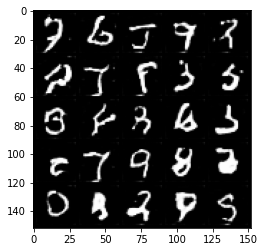

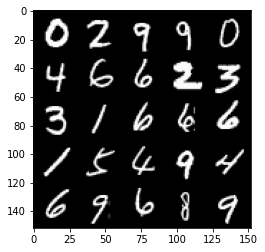

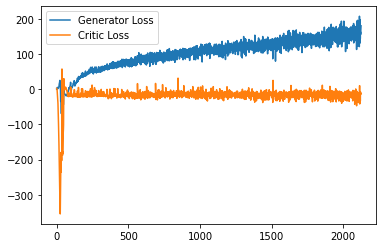

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 91, step 43000: Generator loss: 167.7209542388916, critic loss: -18.188517398211353


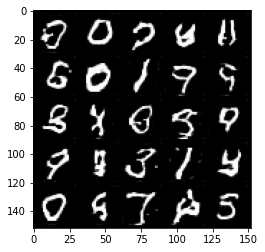

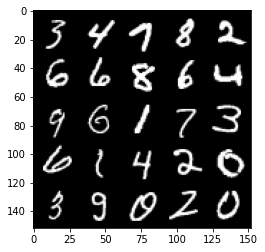

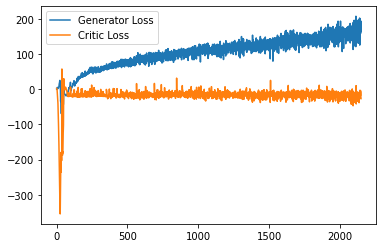

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 92, step 43500: Generator loss: 167.3184616241455, critic loss: -14.903961387410758


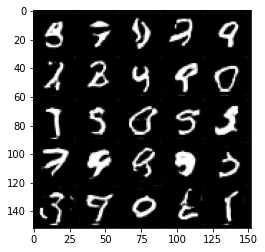

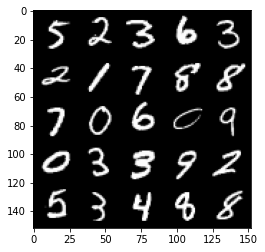

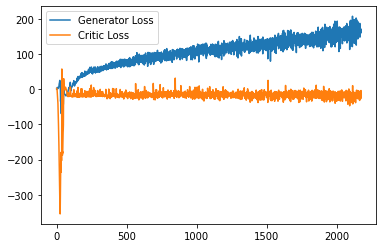

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 93, step 44000: Generator loss: 164.6221086883545, critic loss: -14.885098079949616


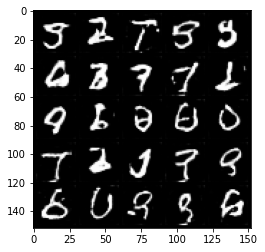

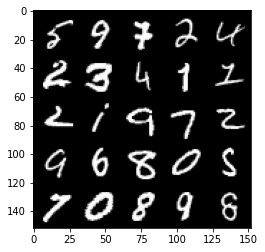

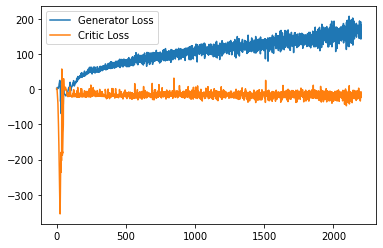

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 94, step 44500: Generator loss: 169.1482332458496, critic loss: -14.225928344494115


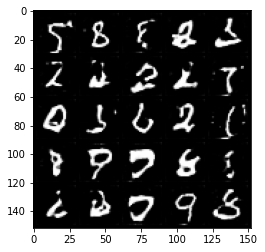

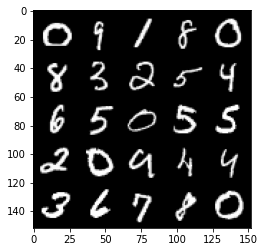

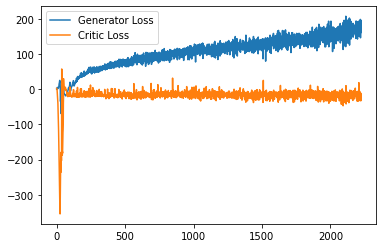

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 95, step 45000: Generator loss: 166.64100427246095, critic loss: -18.791562841916083


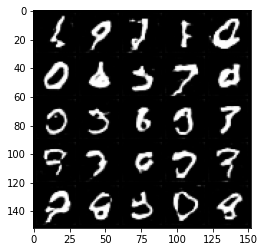

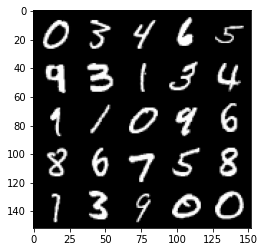

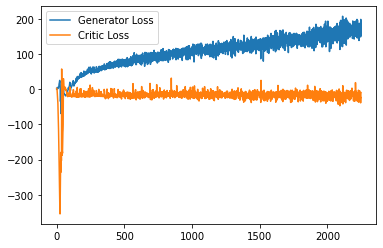

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 97, step 45500: Generator loss: 175.6243627319336, critic loss: -16.493833664345736


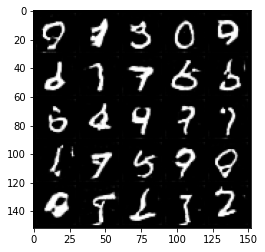

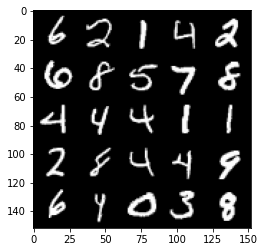

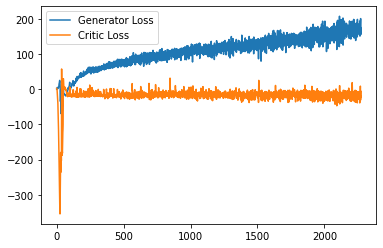

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 98, step 46000: Generator loss: 171.10401229095459, critic loss: -16.67351574431064


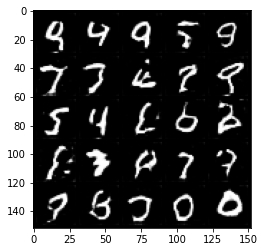

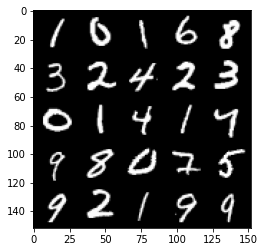

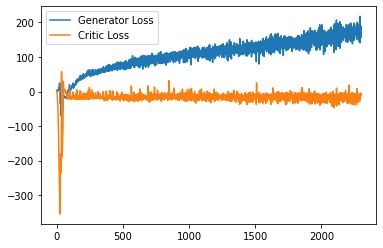

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 99, step 46500: Generator loss: 175.63515956115722, critic loss: -18.25924135333298


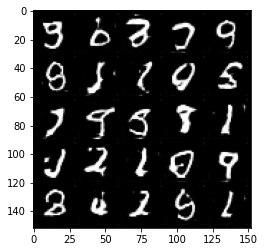

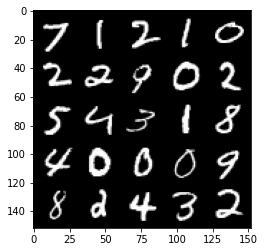

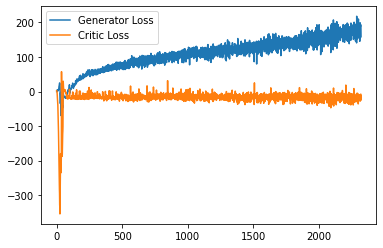

In [14]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader devuelve los lotes
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Actualizar el crítico ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Lleve un registro de la pérdida crítica promedio en este lote
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Actualizar gradientes
            crit_loss.backward(retain_graph=True)
            # Actualizar optimizadores
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Actualizar generador ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Actualizar los pesos
        gen_opt.step()

        # Lleve un registro de la pérdida promedio del generador
        generator_losses += [gen_loss.item()]

        ### Visualización del código ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1